In [2]:
import pandas as pd

df = pd.read_excel('Data/Data.xlsx', sheet_name=1, header=None, skiprows=1)

feature_vector = df.iloc[0:1086, :]

additional_features = df.iloc[1087:1099, :]

feature_vector.reset_index(drop=True, inplace=True)
additional_features.reset_index(drop=True, inplace=True)


feature_vector_T = feature_vector.transpose()
additional_features_T = additional_features.transpose()

full_data = pd.concat([feature_vector_T, additional_features_T], axis=1)

full_data.reset_index(drop=True, inplace=True)


df = full_data
df = df.drop(0, axis=0)
df
df.to_csv('output.csv', index=False)

import pandas as pd

df = pd.read_excel('Data/Data.xlsx', sheet_name=1, header=None, skiprows=1)

feature_vector = df.iloc[0:1086, :]

additional_features = df.iloc[1087:1099, :]

feature_vector.reset_index(drop=True, inplace=True)
additional_features.reset_index(drop=True, inplace=True)


feature_vector_T = feature_vector.transpose()
additional_features_T = additional_features.transpose()

full_data = pd.concat([feature_vector_T, additional_features_T], axis=1)

full_data.reset_index(drop=True, inplace=True)


df = full_data
df = df.drop(0, axis=0)
df
df.to_csv('output.csv', index=False)


new_header = df.iloc[0]
df = df[1:]
df.columns = new_header

# Reset index for the final DataFrame
df.reset_index(drop=True, inplace=True)

df.head()

pd.set_option('display.max_columns', None)  

df = df[~df.isin(['x']).any(axis=1)]

one_hot_encoded_data = pd.get_dummies(df, columns = ['Digester', 'Source', 'Type', 'Waste', 'Biomass']).astype(int)
# print(one_hot_encoded_data)
df_use = one_hot_encoded_data

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler

# Function to build the neural network model
def build_model(input_shape):
    model = Sequential([
        Conv1D(filters=128, kernel_size=3, activation='relu', input_shape=input_shape),
        Conv1D(filters=128, kernel_size=3, activation='relu'),
        Conv1D(filters=128, kernel_size=3, activation='relu'),
        Dropout(0.3),
        # Conv1D(filters=64, kernel_size=3, activation='relu'),
        # Conv1D(filters=64, kernel_size=3, activation='relu'),
        # Conv1D(filters=64, kernel_size=3, activation='relu'),
        # Dropout(0.3),
        Conv1D(filters=64, kernel_size=3, activation='relu'),
        Conv1D(filters=64, kernel_size=3, activation='relu'),
        Conv1D(filters=64, kernel_size=3, activation='relu'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=3, activation='relu'),
        Conv1D(filters=32, kernel_size=3, activation='relu'),
        Conv1D(filters=32, kernel_size=3, activation='relu'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=3, activation='relu'),
        Conv1D(filters=32, kernel_size=3, activation='relu'),
        Conv1D(filters=32, kernel_size=3, activation='relu'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.0001))
    return model

In [4]:
# Target columns
target_columns = ['ACE-km', 'H2-km']

# Clean the data and remove rows with 'x'
df_cleaned = df_use[~df_use.isin(['x']).any(axis=1)]

# Identify digester columns and define groups
digester_columns = [col for col in df_cleaned.columns if col.startswith('Digester')]
groups = df_cleaned[digester_columns].idxmax(axis=1)

# Apply MinMax normalization only to non-target columns
non_target_columns = df_cleaned.select_dtypes(include=[np.number]).columns.difference(target_columns)
scaler = MinMaxScaler()
df_cleaned[non_target_columns] = scaler.fit_transform(df_cleaned[non_target_columns])

from sklearn.preprocessing import StandardScaler

# Apply standard scaling

df_cleaned = df_cleaned.astype(np.float32)

# Initialize Leave-One-Group-Out cross-validator
logo = LeaveOneGroupOut()

# Perform cross-validation for each target
for target_column in target_columns:
    # Prepare data for the target variable
    X = df_cleaned.drop(columns=target_columns).values
    y = df_cleaned[target_column].values

    # Reshape X for Conv1D
    X = X.reshape(X.shape[0], X.shape[1], 1)

    y_tests = []
    y_preds = []

    for train_index, test_index in logo.split(X, y, groups):
        # Split data into training and testing sets
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Build and train the model
        model = build_model((X_train.shape[1], 1))
        early_stopping = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
        model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, callbacks=[early_stopping])

        # Predict and store results
        y_pred = model.predict(X_test).flatten()
        y_tests.extend(y_test)
        y_preds.extend(y_pred)

    # Evaluate model performance
    mse_overall = mean_squared_error(y_tests, y_preds)
    r2_overall = r2_score(y_tests, y_preds)

    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_tests, y_preds, alpha=0.7, edgecolors='w', label='Predicted vs Actual')
    plt.plot([min(y_tests), max(y_tests)], [min(y_tests), max(y_tests)], 'k--', lw=2, label='Ideal Fit')
    plt.xlabel('Actual ' + target_column)
    plt.ylabel('Predicted ' + target_column)
    plt.title('Aggregated Actual vs Predicted Values of ' + target_column)
    plt.legend()
    plt.grid(True)
    plt.show()

    # Print overall results
    print(f"\nOverall Cross-Validation Metrics for {target_column}:")
    print(f"Mean Squared Error: {mse_overall:.4f}")
    print(f"R-squared: {r2_overall:.4f}")


NotImplementedError: numpy() is only available when eager execution is enabled.

2024-11-18 12:28:14.290568: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-18 12:28:14.359316: W tensorflow/c/c_api.cc:304] Operation '{name:'training_30/Adam/conv1d_662/bias/v/Assign' id:18023 op device:{requested: '', assigned: ''} def:{{{node training_30/Adam/conv1d_662/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_30/Adam/conv1d_662/bias/v, training_30/Adam/conv1d_662/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-18 12:28:14.716742: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-18 12:28:14.890261: I tensorflow/core/grappler/optimizers/cu


Top 10 features for ACE-km based on LRP across folds:
Type_CSTR: selected in 18 folds
d__Bacteria;p__Patescibacteria;c__ABY1;o__Candidatus_Magasanikbacteria;f__Candidatus_Magasanikbacteria;g__Candidatus_Magasanikbacteria: selected in 16 folds
Source_I: selected in 14 folds
d__Bacteria;p__Chloroflexi;c__Anaerolineae;o__Anaerolineales;f__Anaerolineaceae;g__Pelolinea: selected in 14 folds
Source_P: selected in 13 folds
Biomass_F: selected in 12 folds
d__Bacteria;p__Dependentiae;c__Babeliae;o__Babeliales;f__Vermiphilaceae;g__Vermiphilaceae: selected in 12 folds
d__Bacteria;p__Cloacimonadota;c__Cloacimonadia;o__Cloacimonadales;f__Cloacimonadaceae;g__LNR_A2-18: selected in 11 folds
Waste_PP: selected in 9 folds
d__Archaea;p__Euryarchaeota;c__Methanobacteria;o__Methanobacteriales;f__Methanobacteriaceae;g__Methanobacterium: selected in 7 folds


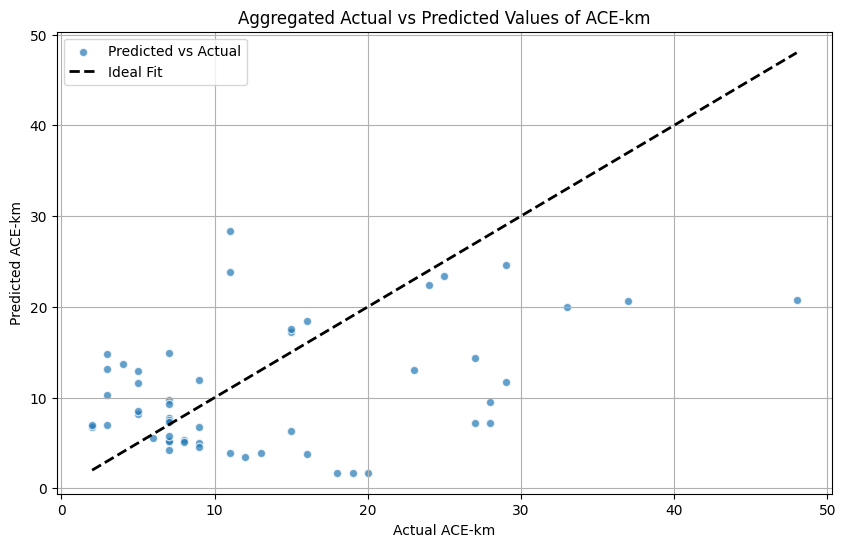


Overall Cross-Validation Metrics for ACE-km:
Mean Squared Error: 101.6177
R-squared: 0.0203


2024-11-18 13:02:41.876470: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-18 13:02:42.046243: W tensorflow/c/c_api.cc:304] Operation '{name:'conv1d_955/kernel/Assign' id:59882 op device:{requested: '', assigned: ''} def:{{{node conv1d_955/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv1d_955/kernel, conv1d_955/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-18 13:02:43.229592: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-18 13:02:43.649549: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin opti


Top 10 features for H2-km based on LRP across folds:
d__Bacteria;p__Chloroflexi;c__Anaerolineae;o__Anaerolineales;f__Anaerolineaceae;g__Leptolinea: selected in 18 folds
Type_CSTR: selected in 18 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophia;o__Syntrophales;f__Syntrophaceae;g__Syntrophus: selected in 18 folds
d__Bacteria;p__Chloroflexi;c__Dehalococcoidia;o__GIF9;f__GIF9;g__GIF9: selected in 18 folds
d__Bacteria;p__Spirochaetota;c__Leptospirae;o__Leptospirales;f__Leptospiraceae;g__RBG-16-49-21: selected in 16 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophobacteria;o__Syntrophobacterales;f__Syntrophobacteraceae;g__Syntrophobacter: selected in 16 folds
d__Bacteria;p__Patescibacteria;c__ABY1;o__Candidatus_Magasanikbacteria;f__Candidatus_Magasanikbacteria;g__Candidatus_Magasanikbacteria: selected in 13 folds
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__[Eubacterium]_coprostanoligenes_group;g__[Eubacterium]_coprostanoligenes_group: selected in 12 folds
d__Bacteria;p

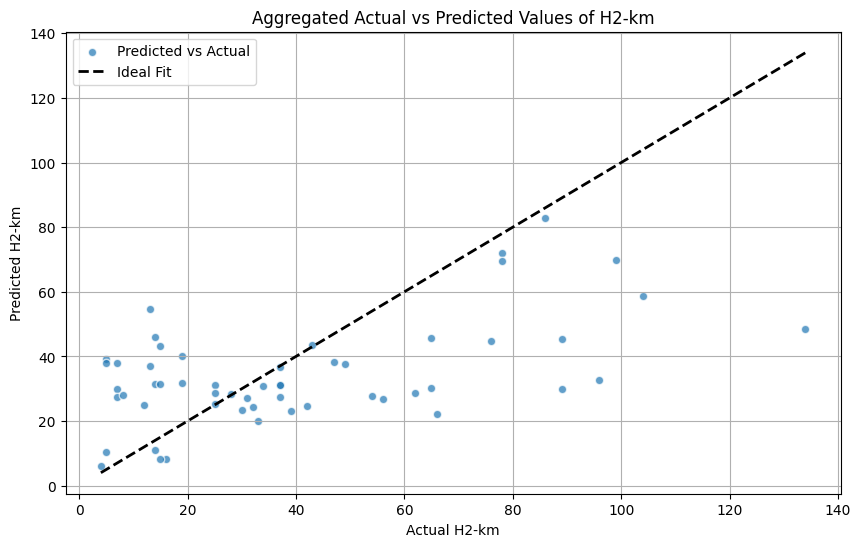


Overall Cross-Validation Metrics for H2-km:
Mean Squared Error: 709.8474
R-squared: 0.2587


In [ ]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from collections import Counter
import innvestigate

# Disable eager execution for compatibility with innvestigate
tf.compat.v1.disable_eager_execution()

# Function to build the neural network model with dynamic kernel size
def build_model(input_shape):
    kernel_size = 3 if input_shape[0] >= 3 else 1  # Dynamically adjust kernel size based on input shape
    # model = Sequential([
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding='same'),
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Dropout(0.3),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Dropout(0.3),
    #     Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Flatten(),
    #     Dense(64, activation='relu'),
    #     Dense(1)
    # ])
    model = Sequential([
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding= 'same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001))
    return model

# Target columns
target_columns = ['ACE-km', 'H2-km']

# Clean the data and remove rows with 'x'
df_cleaned = df_use[~df_use.isin(['x']).any(axis=1)]

# Identify digester columns and define groups
digester_columns = [col for col in df_cleaned.columns if col.startswith('Digester')]
groups = df_cleaned[digester_columns].idxmax(axis=1)

# Apply MinMax normalization only to non-target columns
non_target_columns = df_cleaned.select_dtypes(include=[np.number]).columns.difference(target_columns)
scaler = MinMaxScaler()
df_cleaned[non_target_columns] = scaler.fit_transform(df_cleaned[non_target_columns])

df_cleaned = df_cleaned.astype(np.float32)

# Initialize Leave-One-Group-Out cross-validator
logo = LeaveOneGroupOut()

# LRP feature relevance storage
lrp_cache = pd.DataFrame()

# Perform cross-validation for each target
for target_column in target_columns:
    X = df_cleaned.drop(columns=target_columns)
    y = df_cleaned[target_column].values
    X = X.values.reshape(X.shape[0], X.shape[1], 1)  # Reshape for Conv1D

    all_selected_features = []
    y_tests, y_preds = [], []

    for train_index, test_index in logo.split(X, y, groups):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Build and train model for LRP
        model = build_model((X_train.shape[1], 1))
        model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, callbacks=[EarlyStopping(monitor='loss', patience=5)])

        # Run LRP analysis to rank features by relevance
        analyzer = innvestigate.create_analyzer("lrp.z", model)  # Using LRP with "z" rule
        relevance_scores = analyzer.analyze(X_train)[:, :, 0]  # Relevance scores for each feature
        relevance_mean = relevance_scores.mean(axis=0)
        
        # Store LRP scores in DataFrame
        lrp = pd.DataFrame(relevance_mean, index=df_cleaned.drop(columns=target_columns).columns, columns=["Score"])
        lrp["Abs Score"] = np.abs(lrp["Score"])
        lrp.sort_values(by="Abs Score", ascending=False, inplace=True)
        
        # Ensure at least 3 features are selected for compatibility with kernel size 3
        num_features = max(3, 10)
        selected_features = lrp.index[:num_features]
        all_selected_features.extend(selected_features)

        # Get indices of the top features directly from df_cleaned
        selected_indices = [df_cleaned.drop(columns=target_columns).columns.get_loc(col) for col in selected_features]
        
        # Select most relevant features for training using indices
        X_train_rfe = X_train[:, selected_indices]
        X_test_rfe = X_test[:, selected_indices]

        # Retrain model using only the selected features
        model = build_model((X_train_rfe.shape[1], 1))
        model.fit(X_train_rfe, y_train, epochs=100, batch_size=16, verbose=0)

        # Predict on the test set and collect results
        y_pred = model.predict(X_test_rfe).flatten()
        y_tests.extend(y_test)
        y_preds.extend(y_pred)

    # Print top selected features across folds
    feature_counter = Counter(all_selected_features)
    top_features = feature_counter.most_common(10)
    print(f"\nTop 10 features for {target_column} based on LRP across folds:")
    for feature, count in top_features:
        print(f"{feature}: selected in {count} folds")

    # Calculate and display overall metrics
    mse_overall = mean_squared_error(y_tests, y_preds)
    r2_overall = r2_score(y_tests, y_preds)
    
    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_tests, y_preds, alpha=0.7, edgecolors='w', label='Predicted vs Actual')
    plt.plot([min(y_tests), max(y_tests)], [min(y_tests), max(y_tests)], 'k--', lw=2, label='Ideal Fit')
    plt.xlabel(f'Actual {target_column}')
    plt.ylabel(f'Predicted {target_column}')
    plt.title(f'Aggregated Actual vs Predicted Values of {target_column}')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\nOverall Cross-Validation Metrics for {target_column}:")
    print(f"Mean Squared Error: {mse_overall:.4f}")
    print(f"R-squared: {r2_overall:.4f}")


2024-11-26 10:08:03.699883: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1 Pro
2024-11-26 10:08:03.699910: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2024-11-26 10:08:03.699917: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
2024-11-26 10:08:03.699976: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-11-26 10:08:03.700009: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:269] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2024-11-26 10:08:04.019558: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:303] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. You


Top 10 features for ACE-km based on LRP across folds:
Type_CSTR: selected in 18 folds
Source_P: selected in 17 folds
Source_I: selected in 15 folds
d__Bacteria;p__Dependentiae;c__Babeliae;o__Babeliales;f__Vermiphilaceae;g__Vermiphilaceae: selected in 14 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophobacteria;o__Syntrophobacterales;f__Syntrophobacteraceae;g__Syntrophobacter: selected in 13 folds
d__Bacteria;p__Patescibacteria;c__ABY1;o__Candidatus_Magasanikbacteria;f__Candidatus_Magasanikbacteria;g__Candidatus_Magasanikbacteria: selected in 12 folds
d__Bacteria;p__Chloroflexi;c__Anaerolineae;o__Anaerolineales;f__Anaerolineaceae;g__Pelolinea: selected in 12 folds
Biomass_F: selected in 10 folds
d__Bacteria;p__Cloacimonadota;c__Cloacimonadia;o__Cloacimonadales;f__Cloacimonadaceae;g__LNR_A2-18: selected in 10 folds
Source_M: selected in 9 folds


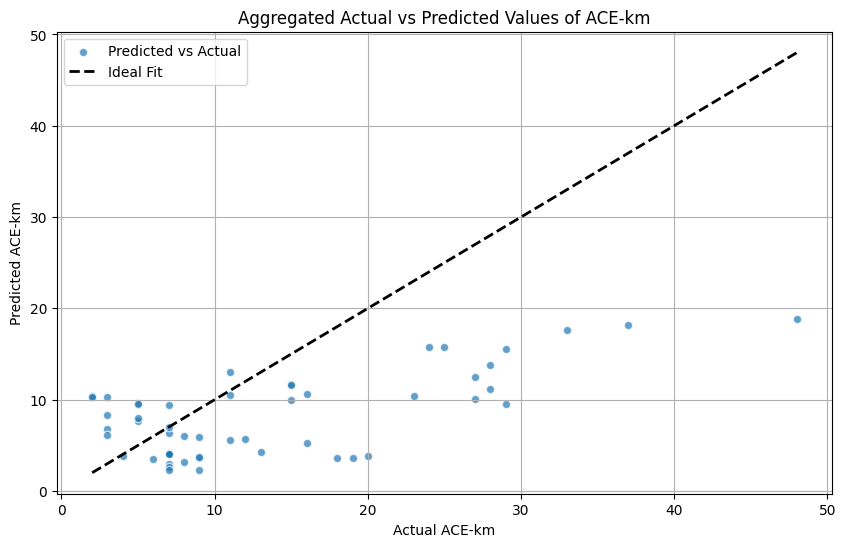


Overall Cross-Validation Metrics for ACE-km:
Mean Squared Error: 90.5903
R-squared: 0.1266


2024-11-26 10:47:56.585385: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 10:47:56.886508: W tensorflow/c/c_api.cc:304] Operation '{name:'training_72/Adam/dense_73/kernel/m/Assign' id:70394 op device:{requested: '', assigned: ''} def:{{{node training_72/Adam/dense_73/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_72/Adam/dense_73/kernel/m, training_72/Adam/dense_73/kernel/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 10:47:58.689315: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 10:47:59.356307: I tensorflow/core/grappler/optimizers/cu


Top 10 features for H2-km based on LRP across folds:
d__Bacteria;p__Chloroflexi;c__Anaerolineae;o__Anaerolineales;f__Anaerolineaceae;g__Leptolinea: selected in 17 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophia;o__Syntrophales;f__Syntrophaceae;g__Syntrophus: selected in 17 folds
d__Bacteria;p__Patescibacteria;c__ABY1;o__Candidatus_Magasanikbacteria;f__Candidatus_Magasanikbacteria;g__Candidatus_Magasanikbacteria: selected in 17 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophobacteria;o__Syntrophobacterales;f__Syntrophobacteraceae;g__Syntrophobacter: selected in 16 folds
d__Bacteria;p__Spirochaetota;c__Leptospirae;o__Leptospirales;f__Leptospiraceae;g__RBG-16-49-21: selected in 14 folds
d__Bacteria;p__Chloroflexi;c__Dehalococcoidia;o__GIF9;f__GIF9;g__GIF9: selected in 13 folds
Type_CSTR: selected in 13 folds
d__Bacteria;p__Synergistota;c__Synergistia;o__Synergistales;f__Synergistaceae;g__Lactivibrio: selected in 9 folds
d__Bacteria;p__Firmicutes;c__Clostridia;o__Oscillospirales;f__

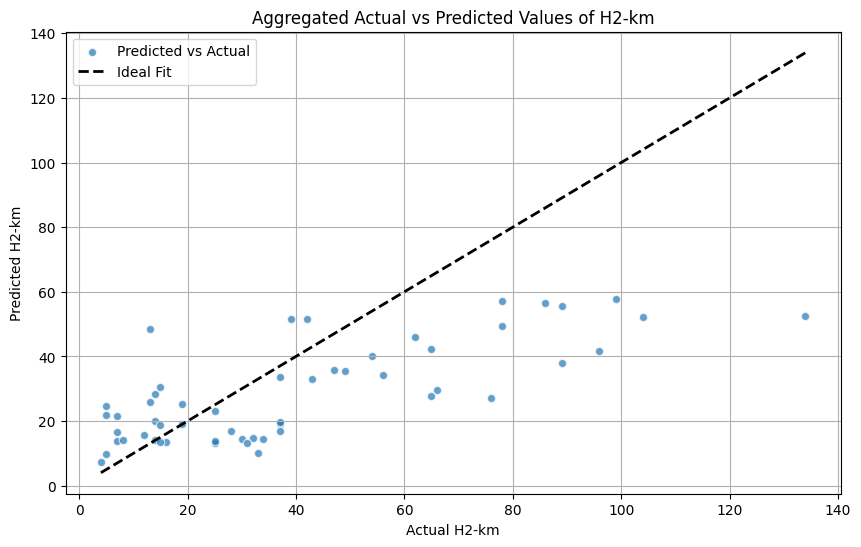


Overall Cross-Validation Metrics for H2-km:
Mean Squared Error: 616.5777
R-squared: 0.3561


In [2]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from collections import Counter
import innvestigate

# Disable eager execution for compatibility with innvestigate
tf.compat.v1.disable_eager_execution()

# Function to build the neural network model with dynamic kernel size
def build_model(input_shape):
    kernel_size = 3 if input_shape[0] >= 3 else 1  # Dynamically adjust kernel size based on input shape
    # model = Sequential([
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding='same'),
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Dropout(0.3),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Dropout(0.3),
    #     Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Flatten(),
    #     Dense(64, activation='relu'),
    #     Dense(1)
    # ])
    model = Sequential([
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding= 'same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001))
    return model

# Target columns
target_columns = ['ACE-km', 'H2-km']

# Clean the data and remove rows with 'x'
df_cleaned = df_use[~df_use.isin(['x']).any(axis=1)]

# Identify digester columns and define groups
digester_columns = [col for col in df_cleaned.columns if col.startswith('Digester')]
groups = df_cleaned[digester_columns].idxmax(axis=1)

# Apply MinMax normalization only to non-target columns
non_target_columns = df_cleaned.select_dtypes(include=[np.number]).columns.difference(target_columns)
scaler = MinMaxScaler()
df_cleaned[non_target_columns] = scaler.fit_transform(df_cleaned[non_target_columns])

df_cleaned = df_cleaned.astype(np.float32)

# Initialize Leave-One-Group-Out cross-validator
logo = LeaveOneGroupOut()

# LRP feature relevance storage
lrp_cache = pd.DataFrame()

# Perform cross-validation for each target
for target_column in target_columns:
    X = df_cleaned.drop(columns=target_columns)
    y = df_cleaned[target_column].values
    X = X.values.reshape(X.shape[0], X.shape[1], 1)  # Reshape for Conv1D

    all_selected_features = []
    y_tests, y_preds = [], []

    for train_index, test_index in logo.split(X, y, groups):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Build and train model for LRP
        model = build_model((X_train.shape[1], 1))
        model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, callbacks=[EarlyStopping(monitor='loss', patience=5)])

        # Run LRP analysis to rank features by relevance
        analyzer = innvestigate.create_analyzer("lrp.z", model)  # Using LRP with "z" rule
        relevance_scores = analyzer.analyze(X_train)[:, :, 0]  # Relevance scores for each feature
        relevance_mean = relevance_scores.mean(axis=0)
        
        # Store LRP scores in DataFrame
        lrp = pd.DataFrame(relevance_mean, index=df_cleaned.drop(columns=target_columns).columns, columns=["Score"])
        lrp["Abs Score"] = np.abs(lrp["Score"])
        lrp.sort_values(by="Abs Score", ascending=False, inplace=True)
        
        # Ensure at least 3 features are selected for compatibility with kernel size 3
        num_features = max(3, 10)
        selected_features = lrp.index[:num_features]
        all_selected_features.extend(selected_features)

        # Get indices of the top features directly from df_cleaned
        selected_indices = [df_cleaned.drop(columns=target_columns).columns.get_loc(col) for col in selected_features]
        
        # Select most relevant features for training using indices
        X_train_rfe = X_train[:, selected_indices]
        X_test_rfe = X_test[:, selected_indices]

        # Retrain model using only the selected features
        model = build_model((X_train_rfe.shape[1], 1))
        model.fit(X_train_rfe, y_train, epochs=100, batch_size=16, verbose=0)

        # Predict on the test set and collect results
        y_pred = model.predict(X_test_rfe).flatten()
        y_tests.extend(y_test)
        y_preds.extend(y_pred)

    # Print top selected features across folds
    feature_counter = Counter(all_selected_features)
    top_features = feature_counter.most_common(10)
    print(f"\nTop 10 features for {target_column} based on LRP across folds:")
    for feature, count in top_features:
        print(f"{feature}: selected in {count} folds")

    # Calculate and display overall metrics
    mse_overall = mean_squared_error(y_tests, y_preds)
    r2_overall = r2_score(y_tests, y_preds)
    
    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_tests, y_preds, alpha=0.7, edgecolors='w', label='Predicted vs Actual')
    plt.plot([min(y_tests), max(y_tests)], [min(y_tests), max(y_tests)], 'k--', lw=2, label='Ideal Fit')
    plt.xlabel(f'Actual {target_column}')
    plt.ylabel(f'Predicted {target_column}')
    plt.title(f'Aggregated Actual vs Predicted Values of {target_column}')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\nOverall Cross-Validation Metrics for {target_column}:")
    print(f"Mean Squared Error: {mse_overall:.4f}")
    print(f"R-squared: {r2_overall:.4f}")


2024-11-27 09:17:57.832410: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-27 09:17:57.883055: W tensorflow/c/c_api.cc:304] Operation '{name:'training_2/Adam/conv1d_21/bias/v/Assign' id:2575 op device:{requested: '', assigned: ''} def:{{{node training_2/Adam/conv1d_21/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_2/Adam/conv1d_21/bias/v, training_2/Adam/conv1d_21/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-27 09:17:57.935433: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-27 09:17:58.063843: I tensorflow/core/grappler/optimizers/custom_grap


Top 10 features for ACE-km based on LRP across folds:
Type_CSTR: selected in 18 folds
d__Bacteria;p__Chloroflexi;c__Anaerolineae;o__Anaerolineales;f__Anaerolineaceae;g__Pelolinea: selected in 18 folds
d__Bacteria;p__Dependentiae;c__Babeliae;o__Babeliales;f__Vermiphilaceae;g__Vermiphilaceae: selected in 18 folds
Source_P: selected in 18 folds
d__Bacteria;p__Planctomycetota;c__Pla4_lineage;o__Pla4_lineage;f__Pla4_lineage;g__Pla4_lineage: selected in 18 folds
Source_I: selected in 18 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophobacteria;o__Syntrophobacterales;f__Syntrophobacteraceae;g__Syntrophobacter: selected in 18 folds
d__Bacteria;p__Verrucomicrobiota;c__Chlamydiae;o__LD1-PA32;f__LD1-PA32;g__LD1-PA32: selected in 18 folds
d__Bacteria;p__Cloacimonadota;c__Cloacimonadia;o__Cloacimonadales;f__Cloacimonadaceae;g__LNR_A2-18: selected in 18 folds
d__Bacteria;p__Verrucomicrobiota;c__Kiritimatiellae;o__WCHB1-41;f__WCHB1-41;g__WCHB1-41: selected in 18 folds


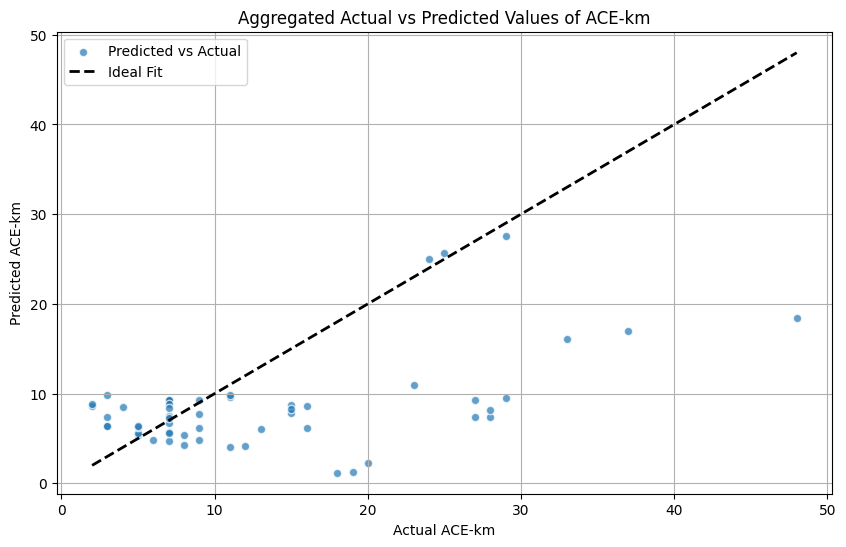


Overall Cross-Validation Metrics for ACE-km:
Mean Squared Error: 97.2620
R-squared: 0.0623


2024-11-27 12:22:59.723326: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-27 12:22:59.981695: W tensorflow/c/c_api.cc:304] Operation '{name:'training_74/Adam/conv1d_562/bias/v/Assign' id:71941 op device:{requested: '', assigned: ''} def:{{{node training_74/Adam/conv1d_562/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_74/Adam/conv1d_562/bias/v, training_74/Adam/conv1d_562/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-27 12:23:01.650046: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-27 12:23:02.181588: I tensorflow/core/grappler/optimizers/cu


Top 10 features for H2-km based on LRP across folds:
d__Bacteria;p__Chloroflexi;c__Anaerolineae;o__Anaerolineales;f__Anaerolineaceae;g__Leptolinea: selected in 18 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophia;o__Syntrophales;f__Syntrophaceae;g__Syntrophus: selected in 18 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophobacteria;o__Syntrophobacterales;f__Syntrophobacteraceae;g__Syntrophobacter: selected in 18 folds
d__Bacteria;p__Chloroflexi;c__Dehalococcoidia;o__GIF9;f__GIF9;g__GIF9: selected in 18 folds
d__Bacteria;p__Spirochaetota;c__Leptospirae;o__Leptospirales;f__Leptospiraceae;g__RBG-16-49-21: selected in 18 folds
d__Bacteria;p__Patescibacteria;c__ABY1;o__Candidatus_Magasanikbacteria;f__Candidatus_Magasanikbacteria;g__Candidatus_Magasanikbacteria: selected in 18 folds
d__Bacteria;p__Cloacimonadota;c__Cloacimonadia;o__Cloacimonadales;f__Cloacimonadaceae;g__LNR_A2-18: selected in 18 folds
Type_CSTR: selected in 18 folds
d__Bacteria;p__Firmicutes;c__Clostridia;o__Christensene

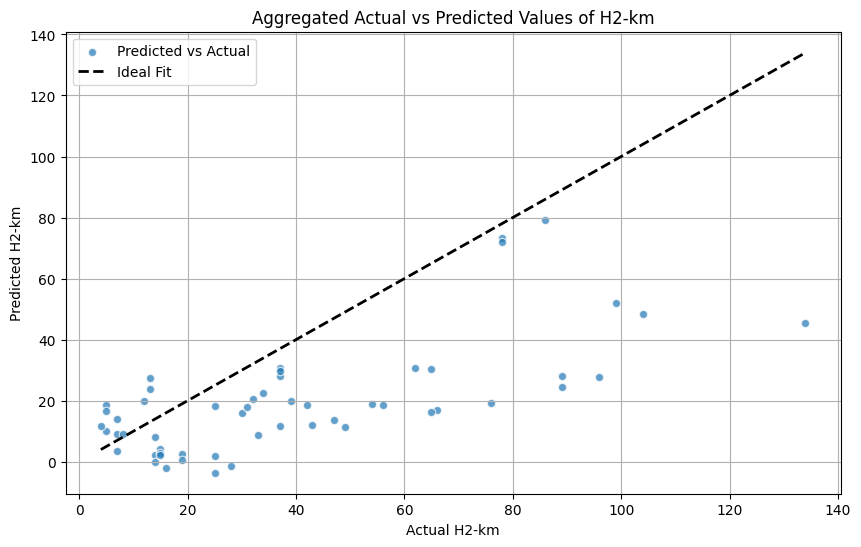


Overall Cross-Validation Metrics for H2-km:
Mean Squared Error: 922.7291
R-squared: 0.0363


In [4]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from collections import Counter
import innvestigate

# Disable eager execution for compatibility with innvestigate
tf.compat.v1.disable_eager_execution()

# Function to build the neural network model with dynamic kernel size
def build_model(input_shape):
    kernel_size = 3 if input_shape[0] >= 3 else 1  # Dynamically adjust kernel size based on input shape
    # model = Sequential([
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding='same'),
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Dropout(0.3),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Dropout(0.3),
    #     Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
    #     Flatten(),
    #     Dense(64, activation='relu'),
    #     Dense(1)
    # ])
    model = Sequential([
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding= 'same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding= 'same'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001))
    return model

# Target columns
target_columns = ['ACE-km', 'H2-km']

# Clean the data and remove rows with 'x'
df_cleaned = df_use[~df_use.isin(['x']).any(axis=1)]

# Identify digester columns and define groups
digester_columns = [col for col in df_cleaned.columns if col.startswith('Digester')]
groups = df_cleaned[digester_columns].idxmax(axis=1)

# Apply MinMax normalization only to non-target columns
non_target_columns = df_cleaned.select_dtypes(include=[np.number]).columns.difference(target_columns)
scaler = MinMaxScaler()
df_cleaned[non_target_columns] = scaler.fit_transform(df_cleaned[non_target_columns])

df_cleaned = df_cleaned.astype(np.float32)

# Initialize Leave-One-Group-Out cross-validator
logo = LeaveOneGroupOut()

# LRP feature relevance storage
lrp_cache = pd.DataFrame()

# Perform cross-validation for each target
for target_column in target_columns:
    X = df_cleaned.drop(columns=target_columns)
    y = df_cleaned[target_column].values
    X = X.values.reshape(X.shape[0], X.shape[1], 1)  # Reshape for Conv1D

    all_selected_features = []
    y_tests, y_preds = [], []

    for train_index, test_index in logo.split(X, y, groups):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Build and train model for LRP
        model = build_model((X_train.shape[1], 1))
        model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, callbacks=[EarlyStopping(monitor='loss', patience=5)])

        # Run LRP analysis to rank features by relevance
        analyzer = innvestigate.create_analyzer("lrp.z", model)  # Using LRP with "z" rule
        relevance_scores = analyzer.analyze(X_train)[:, :, 0]  # Relevance scores for each feature
        relevance_mean = relevance_scores.mean(axis=0)
        
        # Store LRP scores in DataFrame
        lrp = pd.DataFrame(relevance_mean, index=df_cleaned.drop(columns=target_columns).columns, columns=["Score"])
        lrp["Abs Score"] = np.abs(lrp["Score"])
        lrp.sort_values(by="Abs Score", ascending=False, inplace=True)
        
        # Ensure at least 3 features are selected for compatibility with kernel size 3
        num_features = max(3, 100)
        selected_features = lrp.index[:num_features]
        all_selected_features.extend(selected_features)

        # Get indices of the top features directly from df_cleaned
        selected_indices = [df_cleaned.drop(columns=target_columns).columns.get_loc(col) for col in selected_features]
        
        # Select most relevant features for training using indices
        X_train_rfe = X_train[:, selected_indices]
        X_test_rfe = X_test[:, selected_indices]

        # Retrain model using only the selected features
        model = build_model((X_train_rfe.shape[1], 1))
        model.fit(X_train_rfe, y_train, epochs=100, batch_size=16, verbose=0)

        # Predict on the test set and collect results
        y_pred = model.predict(X_test_rfe).flatten()
        y_tests.extend(y_test)
        y_preds.extend(y_pred)

    # Print top selected features across folds
    feature_counter = Counter(all_selected_features)
    top_features = feature_counter.most_common(10)
    print(f"\nTop 10 features for {target_column} based on LRP across folds:")
    for feature, count in top_features:
        print(f"{feature}: selected in {count} folds")

    # Calculate and display overall metrics
    mse_overall = mean_squared_error(y_tests, y_preds)
    r2_overall = r2_score(y_tests, y_preds)
    
    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_tests, y_preds, alpha=0.7, edgecolors='w', label='Predicted vs Actual')
    plt.plot([min(y_tests), max(y_tests)], [min(y_tests), max(y_tests)], 'k--', lw=2, label='Ideal Fit')
    plt.xlabel(f'Actual {target_column}')
    plt.ylabel(f'Predicted {target_column}')
    plt.title(f'Aggregated Actual vs Predicted Values of {target_column}')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\nOverall Cross-Validation Metrics for {target_column}:")
    print(f"Mean Squared Error: {mse_overall:.4f}")
    print(f"R-squared: {r2_overall:.4f}")


In [6]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from collections import Counter
import innvestigate

# Disable eager execution for compatibility with innvestigate
tf.compat.v1.disable_eager_execution()

# Function to build the neural network model with dynamic kernel size
def build_model(input_shape):
    kernel_size = 3 if input_shape[0] >= 3 else 1  # Dynamically adjust kernel size based on input shape
    model = Sequential([
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding='same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.0001))
    return model

# Target columns
target_columns = ['ACE-km', 'H2-km']

# Clean the data and remove rows with 'x'
df_cleaned = df_use[~df_use.isin(['x']).any(axis=1)]

# Identify digester columns and define groups
digester_columns = [col for col in df_cleaned.columns if col.startswith('Digester')]
groups = df_cleaned[digester_columns].idxmax(axis=1)

# Apply MinMax normalization only to non-target columns
non_target_columns = df_cleaned.select_dtypes(include=[np.number]).columns.difference(target_columns)
scaler = MinMaxScaler()
df_cleaned[non_target_columns] = scaler.fit_transform(df_cleaned[non_target_columns])

df_cleaned = df_cleaned.astype(np.float32)

# Initialize Leave-One-Group-Out cross-validator
logo = LeaveOneGroupOut()

# LRP feature relevance storage
lrp_cache = pd.DataFrame()

# Perform cross-validation for each target
for target_column in target_columns:
    X = df_cleaned.drop(columns=target_columns)
    y = df_cleaned[target_column].values
    X = X.values.reshape(X.shape[0], X.shape[1], 1)  # Reshape for Conv1D

    all_selected_features = []
    y_tests, y_preds = [], []

    for train_index, test_index in logo.split(X, y, groups):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Build and train model for LRP
        model = build_model((X_train.shape[1], 1))
        history = model.fit(
            X_train, y_train, 
            epochs=100, batch_size=16, 
            verbose=0, 
            callbacks=[EarlyStopping(monitor='loss', patience=5)]
        )

        # Print the number of epochs used and the loss values
        print(f"\nTraining for target {target_column} in this fold:")
        print(f"Number of epochs used: {len(history.history['loss'])}")
        print(f"Loss values for each epoch: {history.history['loss']}")

        # Run LRP analysis to rank features by relevance
        analyzer = innvestigate.create_analyzer("lrp.z", model)  # Using LRP with "z" rule
        relevance_scores = analyzer.analyze(X_train)[:, :, 0]  # Relevance scores for each feature
        relevance_mean = relevance_scores.mean(axis=0)
        
        # Store LRP scores in DataFrame
        lrp = pd.DataFrame(relevance_mean, index=df_cleaned.drop(columns=target_columns).columns, columns=["Score"])
        lrp["Abs Score"] = np.abs(lrp["Score"])
        lrp.sort_values(by="Abs Score", ascending=False, inplace=True)
        
        # Ensure at least 3 features are selected for compatibility with kernel size 3
        num_features = max(3, 10)
        selected_features = lrp.index[:num_features]
        all_selected_features.extend(selected_features)

        # Get indices of the top features directly from df_cleaned
        selected_indices = [df_cleaned.drop(columns=target_columns).columns.get_loc(col) for col in selected_features]
        
        # Select most relevant features for training using indices
        X_train_rfe = X_train[:, selected_indices]
        X_test_rfe = X_test[:, selected_indices]

        # Retrain model using only the selected features
        model = build_model((X_train_rfe.shape[1], 1))
        history = model.fit(
            X_train_rfe, y_train, 
            epochs=100, batch_size=16, 
            verbose=0, 
            callbacks=[EarlyStopping(monitor='loss', patience=5)]
        )

        # Print the number of epochs used and the loss values
        print(f"Number of epochs used for retraining: {len(history.history['loss'])}")
        print(f"Loss values for each epoch during retraining: {history.history['loss']}")

        # Predict on the test set and collect results
        y_pred = model.predict(X_test_rfe).flatten()
        y_tests.extend(y_test)
        y_preds.extend(y_pred)

    # Print top selected features across folds
    feature_counter = Counter(all_selected_features)
    top_features = feature_counter.most_common(10)
    print(f"\nTop 10 features for {target_column} based on LRP across folds:")
    for feature, count in top_features:
        print(f"{feature}: selected in {count} folds")

    # Calculate and display overall metrics
    mse_overall = mean_squared_error(y_tests, y_preds)
    r2_overall = r2_score(y_tests, y_preds)
    
    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_tests, y_preds, alpha=0.7, edgecolors='w', label='Predicted vs Actual')
    plt.plot([min(y_tests), max(y_tests)], [min(y_tests), max(y_tests)], 'k--', lw=2, label='Ideal Fit')
    plt.xlabel(f'Actual {target_column}')
    plt.ylabel(f'Predicted {target_column}')
    plt.title(f'Aggregated Actual vs Predicted Values of {target_column}')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\nOverall Cross-Validation Metrics for {target_column}:")
    print(f"Mean Squared Error: {mse_overall:.4f}")
    print(f"R-squared: {r2_overall:.4f}")


2024-11-26 16:41:05.497485: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:41:06.325104: W tensorflow/c/c_api.cc:304] Operation '{name:'training_144/Adam/conv1d_1093/bias/m/Assign' id:140010 op device:{requested: '', assigned: ''} def:{{{node training_144/Adam/conv1d_1093/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_144/Adam/conv1d_1093/bias/m, training_144/Adam/conv1d_1093/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 16:41:11.163168: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:41:12.355061: I tensorflow/core/grappler/opti


Training for target ACE-km in this fold:
Number of epochs used: 64
Loss values for each epoch: [287.5114662320006, 284.2001282935049, 275.6899031096814, 260.96149968165975, 235.82017756443398, 191.771240234375, 135.6551715626436, 107.40263815487133, 118.13507439108456, 109.03483319750019, 106.03846946417117, 109.86549766390931, 110.7961399601955, 109.02406325994754, 103.52376302083333, 104.60040043849571, 105.40746217615464, 103.24168250140022, 102.75730200374828, 101.9728785496132, 100.76793715533088, 98.55500613941865, 98.00008661606732, 98.97978748994716, 97.61668964460785, 94.68302416333965, 97.55447357776119, 98.05687878178615, 93.46586878159466, 93.97551226148418, 92.44423735375499, 91.43914391012753, 89.61749491972081, 86.88549587773342, 83.34391515395221, 81.60592412013634, 79.37793118345971, 76.07405733594707, 73.25163403679343, 67.36540072571998, 59.26496913386326, 54.19749091653263, 48.2680134492762, 42.39089973300111, 31.758425226398543, 26.45263769112381, 23.1019468120500

2024-11-26 16:41:30.437301: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:41:30.969455: W tensorflow/c/c_api.cc:304] Operation '{name:'bias_619/Assign' id:140776 op device:{requested: '', assigned: ''} def:{{{node bias_619/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bias_619, bias_619/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 16:41:35.456170: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:41:36.381490: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:41

Number of epochs used for retraining: 36
Loss values for each epoch during retraining: [287.88644080068553, 287.69998887005977, 287.46405807195924, 287.197816138174, 286.8474336511949, 286.43539608226104, 285.8011202344707, 284.73823876474415, 283.1731657140395, 280.1808537501915, 274.5894547256769, 265.8686278100107, 247.59477443321077, 214.48058573404947, 155.9018539727903, 87.58891086952359, 82.76076851639093, 76.05547766591988, 67.17129812053605, 69.8027738683364, 71.37759863161573, 58.02104949951172, 58.06768260282629, 67.71580774643841, 60.86938813153435, 57.89757822074142, 60.22223431456323, 53.606831120509725, 55.65819519641352, 59.69421581193512, 52.008320228726255, 54.47236910053328, 57.99017782772289, 56.624943434023386, 55.92891857670803, 56.51492926653694]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 16:50:37.450543: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_149/BiasAdd' id:142099 op device:{requested: '', assigned: ''} def:{{{node dense_149/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_149/MatMul, dense_149/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 16:50:42.293749: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:50:49.23771


Training for target ACE-km in this fold:
Number of epochs used: 12
Loss values for each epoch: [259.10780304553464, 255.02961701037836, 242.54937385110293, 220.37763348747703, 180.99833110734528, 128.660823765923, 92.95521500531365, 102.05580913319307, 94.04290883681354, 96.87712994743796, 100.32090908873315, 97.60496311561734]


2024-11-26 16:51:04.568691: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:51:05.330886: W tensorflow/c/c_api.cc:304] Operation '{name:'bias_641/Assign' id:144724 op device:{requested: '', assigned: ''} def:{{{node bias_641/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bias_641, bias_641/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 16:51:09.847687: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:51:10.778898: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:51

Number of epochs used for retraining: 24
Loss values for each epoch during retraining: [259.55759983436735, 259.37194165996476, 259.2053144866345, 258.998399921492, 258.7923308727788, 258.5169994877834, 258.1432937921262, 257.64443550857845, 256.8407772288603, 255.35207950367646, 252.48967039818857, 246.35740930893843, 234.98244113548128, 208.30013574338426, 166.53865702012007, 117.10581536386528, 107.43447172875499, 92.72429211934407, 83.47265804515166, 100.29345613367417, 94.71334105846928, 91.18616769828049, 90.79692859275669, 89.61528149773093]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 16:59:32.026478: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_153/BiasAdd' id:145952 op device:{requested: '', assigned: ''} def:{{{node dense_153/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_153/MatMul, dense_153/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 16:59:36.285925: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 16:59:49.67784


Training for target ACE-km in this fold:
Number of epochs used: 64
Loss values for each epoch: [289.3756338266226, 281.42773804297815, 260.9781963641827, 223.75114983778732, 161.60419170673077, 109.65430802565355, 126.39486576960637, 115.60705977219801, 103.34711280235878, 106.98517403235802, 108.42645366375262, 105.10184302696815, 99.79190591665414, 104.1144291804387, 99.12797135573167, 99.2469728910006, 96.30112427931566, 93.94935109065129, 94.50637817382812, 92.42910414475661, 90.0820558988131, 93.5021244929387, 93.4791500384991, 87.29840674767128, 84.952757028433, 84.52198791503906, 83.27051573533278, 78.72274897648738, 75.27376439021184, 71.88240579458383, 68.94649960444524, 63.23926940331092, 59.02264756422777, 53.124799288236176, 45.123761690579926, 41.32694567166842, 31.40461672269381, 28.077302015744724, 21.735719680786133, 22.448539147010216, 24.357241997352013, 24.019604756281925, 22.13714907719539, 16.240013581055862, 15.453029045691856, 13.830008616814247, 12.813684903658

2024-11-26 17:00:15.767678: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:00:16.224718: W tensorflow/c/c_api.cc:304] Operation '{name:'kernel_661/Assign' id:148629 op device:{requested: '', assigned: ''} def:{{{node kernel_661/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](kernel_661, kernel_661/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:00:20.719564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:00:21.862466: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU i

Number of epochs used for retraining: 43
Loss values for each epoch during retraining: [290.2230271559495, 290.08106701190655, 289.8997086745042, 289.67509108323316, 289.4130202073317, 289.0889563927284, 288.60798116830676, 287.87926072340747, 286.93134836050183, 285.050048828125, 282.15322641225964, 275.7412895789513, 264.00408700796277, 242.34415846604568, 203.33583655724158, 151.64151059664212, 84.18436725323016, 106.39783888596754, 86.46321340707632, 63.98785635141226, 72.05845524714543, 77.23557222806491, 62.41497626671424, 66.62242185152493, 66.21494667346661, 62.01059693556566, 64.49093510554387, 61.57965674767127, 68.20466393690843, 70.10972243088942, 61.22104938213642, 58.22460702749399, 65.73815595186673, 59.81795090895433, 58.82604144169734, 58.0946904695951, 53.58590463491586, 49.76714735764723, 50.08390558682955, 57.11497541574332, 55.65860102726863, 52.48507925180289, 55.213296743539665]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 17:10:20.927409: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_157/BiasAdd' id:149805 op device:{requested: '', assigned: ''} def:{{{node dense_157/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_157/MatMul, dense_157/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:10:25.317018: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:10:31.39572


Training for target ACE-km in this fold:
Number of epochs used: 80
Loss values for each epoch: [297.642152075674, 295.3118896484375, 289.6448319379021, 277.7811387005974, 261.7150898353726, 231.17259306066177, 191.3048282698089, 145.4776273802215, 109.67182712928921, 109.58834734150008, 104.22743943158318, 100.73398515289905, 100.95822304370357, 101.4260119269876, 99.25307973225911, 98.61526010550705, 98.90026055130303, 97.1708511651731, 98.56655610776416, 98.14267667134602, 97.53971390630684, 95.94263622807522, 93.1024996439616, 92.28540906719132, 92.3762243308273, 92.88894758037492, 93.0645886589499, 93.14480837653664, 87.75462730258118, 86.1470432655484, 82.71854239819096, 81.6187401378856, 80.21710506140018, 78.94411797616996, 76.97967951905494, 73.71306520349839, 70.83098033830231, 65.34499003840428, 62.52312806073357, 61.22917294969746, 54.30138920802696, 49.913582596124385, 47.636934616986444, 41.42136996400122, 35.68246452481139, 34.033056577046715, 26.881341027278527, 24.3444

2024-11-26 17:10:56.630607: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:10:57.102419: W tensorflow/c/c_api.cc:304] Operation '{name:'bias_675/Assign' id:152430 op device:{requested: '', assigned: ''} def:{{{node bias_675/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bias_675, bias_675/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:11:01.509332: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:11:02.436466: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:11

Number of epochs used for retraining: 49
Loss values for each epoch during retraining: [297.79029277726715, 297.621888403799, 297.42953192018996, 297.22216976390166, 296.9282621495864, 296.52151309742646, 295.9303920222264, 295.0120023839614, 293.13159419041057, 290.28774904737287, 284.93075471765854, 273.1104498470531, 253.47395982929305, 218.44363941865808, 149.09314413631662, 106.29727883432426, 105.33727189606311, 89.26591312184053, 84.43216454749013, 88.10527491102032, 93.67530553481159, 83.95865735820695, 85.24590376311657, 79.84254665000766, 82.27999803131702, 67.47101379843319, 65.23954024969363, 66.28070053399777, 70.99118823631137, 65.60189587462182, 72.21421425015319, 64.31640512803021, 48.873816621069814, 57.128081340415804, 56.249256171432194, 63.476518668380436, 49.1825829300226, 48.61428036409266, 49.637657015931374, 52.999671038459326, 49.73871507831648, 53.595640294692096, 45.19464926626168, 38.64881249970081, 41.214865441415824, 42.3405564252068, 42.8830633724437, 41.

/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 17:20:59.772744: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_161/BiasAdd' id:153658 op device:{requested: '', assigned: ''} def:{{{node dense_161/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_161/MatMul, dense_161/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:21:04.203739: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:21:12.82696


Training for target ACE-km in this fold:
Number of epochs used: 16
Loss values for each epoch: [255.33825563916972, 252.31775620404412, 245.57433723000918, 231.27252496457567, 206.1942861220416, 166.13847014483284, 102.2810411640242, 86.41352657243317, 122.09061013016046, 98.30075432272518, 85.09478920581294, 97.5847615260704, 99.50972312104469, 93.52410335166782, 89.75049093657849, 85.76186138975854]


2024-11-26 17:21:28.250021: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:21:28.718928: W tensorflow/c/c_api.cc:304] Operation '{name:'kernel_683/Assign' id:156107 op device:{requested: '', assigned: ''} def:{{{node kernel_683/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](kernel_683, kernel_683/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:21:32.492456: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:21:33.468259: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU i

Number of epochs used for retraining: 22
Loss values for each epoch during retraining: [255.6563523236443, 255.48219059962852, 255.31458925733378, 255.1142878812902, 254.8068395876417, 254.35376574946386, 253.51589367436426, 251.944694369447, 248.87327291451248, 242.15843604592715, 229.3272028904335, 204.95153569240196, 163.68935470955046, 108.647985570571, 92.15385407092525, 105.64111365523993, 79.15644215602501, 81.40370814005534, 86.40971894357719, 86.73314747155881, 81.74441820032456, 79.20142858168659]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 17:29:54.990447: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_165/BiasAdd' id:157511 op device:{requested: '', assigned: ''} def:{{{node dense_165/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_165/MatMul, dense_165/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:29:59.329028: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:30:04.70400


Training for target ACE-km in this fold:
Number of epochs used: 93
Loss values for each epoch: [297.51243591308594, 293.6719611672794, 282.67253800934435, 263.32831079819624, 226.12837967218138, 166.93835239784391, 116.02389750761144, 122.9380807315602, 110.07698096481025, 102.3754487879136, 110.78350515926586, 110.74878647748162, 103.24550853056066, 102.20319067263135, 109.43987004897174, 107.79842331830193, 100.46775817871094, 99.62354428160424, 98.68047302844478, 99.4163127225988, 97.51196139466529, 100.33683268229167, 99.18923591164982, 96.03569434670841, 99.36120081882851, 96.70096692851945, 93.65166712742226, 94.58320871988933, 90.95865780699486, 89.47136314242493, 89.73894119262695, 86.93812755509919, 86.13246506335689, 83.62755427641027, 81.48083626990224, 80.00777626037598, 76.5749179615694, 75.76003609451593, 73.48754568660961, 70.77805081535789, 66.89740543739468, 60.69101700128294, 53.49387777552885, 50.6747376685049, 47.67177652377708, 41.27757704491709, 30.11037336611280

2024-11-26 17:30:33.549602: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:30:34.061571: W tensorflow/c/c_api.cc:304] Operation '{name:'kernel_711/Assign' id:160169 op device:{requested: '', assigned: ''} def:{{{node kernel_711/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](kernel_711, kernel_711/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:30:38.088031: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:30:39.065993: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU i

Number of epochs used for retraining: 27
Loss values for each epoch during retraining: [297.75398703182447, 297.5593028349035, 297.3461749506932, 297.0589195700253, 296.6922110389261, 296.08336444929535, 295.1700624952129, 293.51454671223956, 290.81966235590914, 285.6157829434264, 275.7222900390625, 256.50198244581037, 224.17222789689606, 174.69271072686888, 128.48824203715606, 125.72544352213542, 146.4420617795458, 125.32391589295631, 110.86098139893775, 117.36174587174958, 118.77059368058747, 105.08349370021446, 107.1138089497884, 118.14080795587277, 106.83816259047565, 108.91111994724648, 109.55345916748047]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 17:40:54.954717: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_169/BiasAdd' id:161364 op device:{requested: '', assigned: ''} def:{{{node dense_169/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_169/MatMul, dense_169/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:40:59.856600: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:41:06.31118


Training for target ACE-km in this fold:
Number of epochs used: 55
Loss values for each epoch: [260.4296641630285, 257.29646989411, 247.70955882352942, 229.21281642539827, 195.7475953943589, 149.21902295654894, 95.73305466595818, 112.06273591284658, 105.82425121232575, 94.36817408543007, 97.97118175730986, 98.80186402563955, 99.08477244657628, 94.55998252419865, 94.2161730598001, 92.99644707698448, 93.52224267697802, 93.2400821984983, 92.79698450425091, 92.51541810877183, 91.78350871217017, 90.71631008970971, 92.02276364494773, 92.72285660575417, 93.0104809181363, 91.7592674704159, 89.79826287662281, 86.19153954001034, 84.91123393937653, 85.82149086746514, 84.24727510938457, 84.60359328400855, 81.08529266656613, 80.42198700998344, 77.97392243030025, 76.04157840504365, 78.42506782681335, 82.79168910606235, 75.8558125963398, 70.64662620249916, 68.60915195240693, 59.26250083773744, 51.50523436303232, 55.20463681688496, 39.54183412065693, 38.27848984213436, 36.5535244287229, 24.5604132109

2024-11-26 17:41:29.306656: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:41:29.799784: W tensorflow/c/c_api.cc:304] Operation '{name:'kernel_722/Assign' id:163908 op device:{requested: '', assigned: ''} def:{{{node kernel_722/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](kernel_722, kernel_722/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:41:34.525868: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:41:35.533516: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU i

Number of epochs used for retraining: 23
Loss values for each epoch during retraining: [260.6191837086397, 260.45365756165745, 260.2740702909582, 260.0589765660903, 259.76221189311906, 259.2992659176097, 258.58238953235104, 257.2462373621324, 254.74507948931526, 250.95178215176452, 242.6069450752408, 227.3449843163584, 199.64236482919432, 149.81292724609375, 91.39025445077934, 95.46735752330108, 93.80790800206802, 73.53651158014934, 93.90116613051471, 94.79512360516716, 96.95955149332683, 89.60770685532513, 86.3898266063017]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 17:51:58.566442: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_173/BiasAdd' id:165217 op device:{requested: '', assigned: ''} def:{{{node dense_173/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_173/MatMul, dense_173/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:52:04.579557: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:52:12.77313


Training for target ACE-km in this fold:
Number of epochs used: 71
Loss values for each epoch: [294.051752427045, 291.7291098949956, 285.1624106425865, 273.67450788909315, 251.923376345167, 217.29358972287645, 156.81287518669578, 112.73114432540595, 114.21212319766774, 109.9648946126302, 104.13209219539867, 106.33325180352902, 106.74611155192058, 103.05116227093865, 100.4269645541322, 102.803207098269, 101.07751801434685, 98.40210043215284, 101.79106835757985, 103.15575266819374, 100.8214382096833, 98.0597318013509, 97.6394801420324, 95.08985272575828, 93.46475309484146, 90.74715849932502, 91.69307514265472, 89.63398402344947, 87.5788117203058, 85.24063499301087, 88.4085797328575, 83.5893954856723, 76.41095456890031, 73.60343536676145, 72.64295563043332, 67.01341023164638, 65.92808098886528, 59.199165942622166, 57.27805182513069, 54.42262305465399, 42.39870490279852, 39.50770037781958, 29.256196152930166, 26.92445238898782, 25.506943197811353, 20.0909740597594, 20.885083441640816, 17.

2024-11-26 17:52:42.270763: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:52:42.852781: W tensorflow/c/c_api.cc:304] Operation '{name:'kernel_736/Assign' id:167704 op device:{requested: '', assigned: ''} def:{{{node kernel_736/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](kernel_736, kernel_736/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 17:52:48.455582: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 17:52:49.570224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU i

Number of epochs used for retraining: 52
Loss values for each epoch during retraining: [294.18210856119794, 293.9821529014438, 293.7651259478401, 293.51303339939494, 293.2112704258339, 292.7903398252001, 292.2269062715418, 291.3756679086124, 289.7646364698223, 287.3206954656863, 282.96645534739775, 274.6744935278799, 256.54493683459714, 224.6157403085746, 169.25183842228907, 113.78430086023667, 90.75845864239861, 83.27471093570485, 78.4078644023222, 77.28563764983532, 73.78306714226218, 85.54851943371342, 85.71347756479301, 74.51059214274089, 70.08715049893249, 67.8104128370098, 69.58195840844921, 73.84897804260254, 63.707491182813456, 67.8027588339413, 68.39520114075904, 68.41291524849686, 65.04814821131089, 62.44846269196155, 60.359395793839994, 57.98261163748947, 63.38951776541916, 56.513936360677086, 53.8129981545841, 55.75498364018459, 54.02299798703661, 54.34594711602903, 51.10683728199379, 49.18876440384809, 48.9349656198539, 51.71865246342678, 39.12638533349131, 51.407827339920

/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 18:04:04.881172: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_177/BiasAdd' id:169070 op device:{requested: '', assigned: ''} def:{{{node dense_177/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_177/MatMul, dense_177/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:04:11.401225: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:04:20.69721


Training for target ACE-km in this fold:
Number of epochs used: 13
Loss values for each epoch: [293.6357210599459, 290.6284907414363, 282.225828904372, 264.9122971754808, 235.15664907602164, 182.94988544170673, 130.92084327110877, 99.64328355055589, 119.92642681415265, 106.35007065993089, 101.35806274414062, 105.55828182513898, 103.19860076904297]


2024-11-26 18:04:39.965639: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:04:40.624453: W tensorflow/c/c_api.cc:304] Operation '{name:'kernel_748/Assign' id:171462 op device:{requested: '', assigned: ''} def:{{{node kernel_748/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](kernel_748, kernel_748/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:04:46.852481: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:04:47.948192: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU i

Number of epochs used for retraining: 42
Loss values for each epoch during retraining: [293.91763070913464, 293.77004183255707, 293.62354689378003, 293.47110983041614, 293.28629009540265, 293.0349848820613, 292.75218083308295, 292.2923513559195, 291.71671588604266, 290.66898287259613, 289.0391798753005, 285.63668118990387, 280.45232450045074, 268.32289240910455, 244.5287604698768, 201.18605166215164, 139.65503516564002, 87.96821828988882, 90.29524348332332, 83.70462094820462, 78.03484755295973, 80.31016540527344, 82.81356430053711, 76.48840684157152, 81.60807389479417, 70.77442697378305, 72.09002392108624, 74.22716272794284, 64.80382508497972, 66.36000647911659, 62.90724358191857, 65.32137474646935, 62.0351556631235, 62.880189162034256, 61.832292996920074, 65.08317624605618, 56.60656474186824, 63.56664041372446, 59.86898921086238, 58.065384498009315, 57.38394986666166, 60.09850281935472]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 18:16:29.941263: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_181/BiasAdd' id:172923 op device:{requested: '', assigned: ''} def:{{{node dense_181/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_181/MatMul, dense_181/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:16:34.686530: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:16:41.63243


Training for target ACE-km in this fold:
Number of epochs used: 13
Loss values for each epoch: [300.10945114434935, 297.0968346689262, 288.6045372158873, 272.0740182913986, 241.37932302437576, 200.13066646632026, 140.15721184599633, 95.61964169670554, 104.6928393794041, 102.53118657130821, 96.74095019172219, 96.80935743743298, 98.97503931382123]


2024-11-26 18:16:57.951234: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:16:58.468946: W tensorflow/c/c_api.cc:304] Operation '{name:'kernel_771/Assign' id:175429 op device:{requested: '', assigned: ''} def:{{{node kernel_771/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](kernel_771, kernel_771/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:17:03.532285: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:17:04.705599: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU i

Number of epochs used for retraining: 29
Loss values for each epoch during retraining: [300.33324372534656, 300.1916099249148, 300.0790816662358, 299.94721760469326, 299.7739527085248, 299.5892444685394, 299.3581200393976, 299.1027072083716, 298.7998833749809, 298.4357983458276, 298.010108498966, 297.46864588120405, 296.7354652554381, 295.7126279344746, 294.1308103075215, 291.1705753102022, 286.2717093673407, 276.4075856676289, 256.1938937318091, 218.26598911659391, 161.5018939223944, 94.98094596114814, 105.33067396575329, 83.61272250904756, 93.74405984317555, 93.62718799067478, 92.36427621280446, 93.84708127788468, 93.76775980930702]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 18:28:11.233101: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_185/BiasAdd' id:176776 op device:{requested: '', assigned: ''} def:{{{node dense_185/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_185/MatMul, dense_185/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:28:16.771477: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:28:25.16982


Training for target ACE-km in this fold:
Number of epochs used: 62
Loss values for each epoch: [294.26362668550934, 290.8263667179988, 280.5791203425481, 261.1794116680439, 224.93920428936298, 171.44119321382962, 109.74345397949219, 106.19158994234525, 103.03204345703125, 101.04258845402644, 104.97596036470853, 99.71849999060997, 99.33127535306491, 95.84560805100661, 95.12173344538762, 95.93084071232722, 96.7726827768179, 95.13638951228215, 93.58929736797626, 92.13969304011418, 93.7069819523738, 92.46890024038461, 90.48723719670222, 91.25971515362079, 89.76111133282001, 89.08005435650165, 86.94896639310397, 81.9543703519381, 80.8170154278095, 79.39990645188551, 79.43578103872446, 79.25144723745493, 73.00497671274039, 70.32598348764273, 67.08524425213153, 60.07777287409856, 55.576215303861176, 51.69318243173453, 43.85689374116751, 39.19421738844652, 32.624055715707634, 24.844532159658577, 20.17930500323956, 19.16676246202909, 20.52968120574951, 20.112065975482647, 21.331307044396034, 1

2024-11-26 18:28:51.848912: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:28:52.432501: W tensorflow/c/c_api.cc:304] Operation '{name:'bias_783/Assign' id:179192 op device:{requested: '', assigned: ''} def:{{{node bias_783/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bias_783, bias_783/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:28:57.811414: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:28:58.953314: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:28

Number of epochs used for retraining: 37
Loss values for each epoch during retraining: [294.5195547250601, 294.3721876878005, 294.2173808171199, 294.0172189565805, 293.7943549522987, 293.482175386869, 293.0480205829327, 292.4722771277794, 291.58438755915716, 289.96399982158954, 287.17948091947113, 281.1262723482572, 270.0774442232572, 249.66336059570312, 209.06034264197717, 147.7870858999399, 118.31678449190579, 145.98625153761643, 120.32265883225661, 120.20321185772235, 119.798463674692, 113.03942401592548, 115.47152709960938, 116.09206096942609, 118.30743114764874, 110.06661635178786, 110.72342975323016, 109.17108682485727, 102.84122290978065, 110.14176177978516, 104.60846475454477, 101.11211189856895, 104.73786178001991, 103.85509960467999, 106.2271470289964, 107.81170434218187, 107.89614193256085]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 18:38:41.712070: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_189/BiasAdd' id:180629 op device:{requested: '', assigned: ''} def:{{{node dense_189/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_189/MatMul, dense_189/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:38:48.323998: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:38:57.84129


Training for target ACE-km in this fold:
Number of epochs used: 81
Loss values for each epoch: [279.1411678089815, 275.5366779402191, 266.45044184666057, 247.15461342007507, 213.5756052054611, 165.77083237030928, 112.77006620519302, 105.59280784457337, 122.06367372999004, 106.81557524437999, 101.11492800245098, 102.06541521408978, 102.7885654112872, 101.68558004790661, 99.54890898162243, 98.73768690520642, 99.69315712124694, 97.80697684194527, 96.74049347522212, 95.60901836320465, 95.66895787856159, 92.63340130974265, 93.18017338771446, 92.3846368228688, 89.65305416256774, 87.21184105966606, 82.99820933622472, 80.07429217357262, 82.41213450712316, 76.864787644031, 73.54862123377183, 70.24779882618026, 64.2847333982879, 59.18654891556385, 54.54198444590849, 49.41840644911224, 41.89683629952225, 35.88684897329293, 29.278431406208114, 19.975541956284466, 19.624261210946475, 18.234606686760397, 19.132260210373822, 19.657633538339653, 17.698080549053117, 14.856270369361429, 15.668375202253

2024-11-26 18:39:29.200800: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:39:29.793605: W tensorflow/c/c_api.cc:304] Operation '{name:'bias_815/Assign' id:183330 op device:{requested: '', assigned: ''} def:{{{node bias_815/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bias_815, bias_815/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:39:35.453376: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:39:36.578071: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:39

Number of epochs used for retraining: 26
Loss values for each epoch during retraining: [279.3240230784697, 279.0335813036152, 278.66474944469974, 278.1554505591299, 277.42451095581055, 276.22130076090497, 273.84752999100033, 269.6939535701976, 263.0225055918974, 248.98925093108534, 224.44755464441636, 186.17270316329657, 122.00794249889897, 86.83477042703068, 98.78909122242646, 89.09443690730076, 82.22300809972427, 91.06247307272518, 79.52354778028003, 79.6334743125766, 71.72314236210842, 76.21688214470359, 74.84363137039483, 75.11920285692402, 72.14817436068665, 73.69979239445107]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 18:52:07.060151: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_193/BiasAdd' id:184482 op device:{requested: '', assigned: ''} def:{{{node dense_193/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_193/MatMul, dense_193/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:52:13.800397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:52:22.33674


Training for target ACE-km in this fold:
Number of epochs used: 20
Loss values for each epoch: [286.68317936915975, 284.80662117752377, 279.0666752235562, 266.9046717625038, 246.15136419558058, 212.65726007199754, 161.53672940123315, 112.16780419443168, 114.4855011584712, 104.7554728938084, 111.73051063687194, 110.85039591321758, 107.23646754844516, 103.57903200037339, 101.91350652657303, 103.94604417389515, 102.84911062203201, 103.01749614640778, 104.0859328625249, 101.9181261249617]


2024-11-26 18:52:43.821491: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:52:44.373372: W tensorflow/c/c_api.cc:304] Operation '{name:'bias_822/Assign' id:186993 op device:{requested: '', assigned: ''} def:{{{node bias_822/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bias_822, bias_822/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 18:52:50.306109: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:52:51.482974: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 18:52

Number of epochs used for retraining: 23
Loss values for each epoch during retraining: [286.7978626326019, 286.5983530680339, 286.3956453285965, 286.1271844751695, 285.78929646809894, 285.30903775084255, 284.65046415141984, 283.4224991143918, 281.12798294366576, 277.2602868173637, 269.06505659514784, 254.16962552538106, 221.23821856928808, 172.60280115464155, 124.41255367503447, 110.18303413017124, 107.91026680142272, 100.48993540745155, 108.5613177430396, 105.48966162812476, 100.91841484518612, 103.78423503800934, 108.41715150720933]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 19:06:32.193908: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_197/BiasAdd' id:188335 op device:{requested: '', assigned: ''} def:{{{node dense_197/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_197/MatMul, dense_197/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 19:06:38.273649: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:06:48.52348


Training for target ACE-km in this fold:
Number of epochs used: 85
Loss values for each epoch: [296.9461550245098, 294.4271539426317, 285.0947181851256, 267.4058511771408, 234.1657185274012, 177.0154266357422, 118.47921229343788, 105.49281460631127, 109.61798447253658, 101.99950057385014, 98.09608504351448, 104.41127919215782, 104.0652214499081, 101.28920139985927, 96.38082287358303, 96.29412153655407, 100.90881960999732, 98.8717233246448, 90.50218866385666, 88.94035429113052, 90.34395225375306, 84.80918914196538, 83.82130125457165, 90.48743835150027, 80.82528746361827, 75.95849313922957, 76.03680090810738, 71.606029734892, 68.1490073484533, 68.71800299251781, 60.496782415053424, 57.7464137357824, 53.65601797664867, 46.03845760869045, 40.47886956906786, 35.192859425264245, 32.16105725250992, 27.025685441260244, 24.97324722888423, 22.119047398660697, 21.600647603764255, 19.970967610677082, 19.78479464147605, 17.145782769895067, 18.25190704944087, 15.235631830552045, 18.38267477820901, 

2024-11-26 19:07:23.035505: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:07:23.703275: W tensorflow/c/c_api.cc:304] Operation '{name:'bias_843/Assign' id:190922 op device:{requested: '', assigned: ''} def:{{{node bias_843/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bias_843, bias_843/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 19:07:30.188155: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:07:31.423120: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:07

Number of epochs used for retraining: 24
Loss values for each epoch during retraining: [297.1214071535597, 296.98074101466756, 296.827683392693, 296.6474040910309, 296.39387063419116, 296.04954468970203, 295.50456626742493, 294.49048868815106, 292.97797977223115, 289.65504425647214, 283.2262471516927, 270.819398169424, 248.5938002642463, 211.798937180463, 139.76005150290098, 77.33720839257334, 116.97447705736347, 77.69623864865771, 64.50897845099954, 70.64609871658624, 73.27440916323194, 71.89824758791455, 69.53816432578891, 67.39333448223039]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 19:23:20.242238: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_201/BiasAdd' id:192188 op device:{requested: '', assigned: ''} def:{{{node dense_201/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_201/MatMul, dense_201/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 19:29:51.002879: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:30:02.25658


Training for target ACE-km in this fold:
Number of epochs used: 82
Loss values for each epoch: [299.25835882448683, 296.21896265067306, 286.5520605947457, 268.35051207448925, 236.56316774031694, 185.00914061303232, 122.69337018330891, 109.25316425398285, 108.44836306104473, 98.63994224398743, 98.0459404739679, 102.03437535903034, 96.34767779181985, 96.63072294347427, 103.12616580140357, 93.1424337648878, 95.16253811705346, 97.8896510554295, 96.75002393535539, 92.99385863659428, 90.13347102146523, 89.69171965355967, 89.87539642932369, 87.64815266927083, 85.13035710652669, 88.95691232120289, 82.32381080178654, 86.35476430257161, 91.96426675833908, 87.26611499926624, 79.38709423588772, 81.0990784588982, 87.41072430330165, 72.79107651056027, 70.42349557315602, 71.58789960075828, 63.21837399052639, 58.606169981115, 63.336760128245636, 51.17693979599897, 43.52073998544731, 44.874353633207434, 38.46120458490708, 32.389307433483644, 26.477591963375318, 22.81940965091481, 23.37421879113889, 19

2024-11-26 19:30:38.711948: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:30:39.287547: W tensorflow/c/c_api.cc:304] Operation '{name:'bias_857/Assign' id:194718 op device:{requested: '', assigned: ''} def:{{{node bias_857/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bias_857, bias_857/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 19:30:45.011224: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:30:46.323860: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:30

Number of epochs used for retraining: 35
Loss values for each epoch during retraining: [299.4767587699142, 299.2801208496094, 299.03192004035503, 298.72649832332837, 298.2679551068474, 297.5789244408701, 296.50925101485905, 294.4779004863664, 290.90639974556717, 284.14307897231157, 270.83847584443936, 247.41925168504903, 205.3434041341146, 147.43487877939262, 85.55162751440908, 102.24565812653186, 80.65254817289464, 72.11218431884167, 80.9153802909103, 82.07211367289226, 73.22253582524318, 83.36573065963447, 67.14154052734375, 70.07709577971814, 64.91107125375785, 76.66465086095474, 74.41770527409572, 70.88710545558556, 70.65708960738837, 61.57729489195581, 63.050680721507355, 73.60505070405848, 73.78839328242283, 66.87159579407935, 66.89027144862156]


/Users/sb/miniforge3/envs/tensorflow/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-11-26 19:44:19.517334: W tensorflow/c/c_api.cc:304] Operation '{name:'dense_205/BiasAdd' id:196041 op device:{requested: '', assigned: ''} def:{{{node dense_205/BiasAdd}} = BiasAdd[T=DT_FLOAT, _has_manual_control_dependencies=true, data_format="NHWC"](dense_205/MatMul, dense_205/BiasAdd/ReadVariableOp)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 19:44:25.771025: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:44:35.22741


Training for target ACE-km in this fold:
Number of epochs used: 89
Loss values for each epoch: [297.5754434922162, 294.88810640222886, 286.2179930443857, 271.3061744839537, 245.49332442938112, 202.56757848403032, 147.0313586066751, 110.473856159285, 114.42420809876685, 113.59969075520833, 112.46505782183479, 108.62981669108073, 104.22137720444623, 101.59193914076862, 101.36742988287234, 100.13055838790595, 99.68047213086895, 100.40070208381204, 100.24566994461358, 98.13206698847752, 99.11791558359184, 98.78401142943139, 97.33064920762006, 95.96309168198529, 95.67691758099724, 96.28981033026004, 94.11191652335373, 93.03684301937328, 94.69825136895274, 93.69117572260838, 89.80773103003408, 89.71717819513059, 88.53303752225987, 85.6849116157083, 88.94070378471824, 89.13383035098805, 83.78505796544692, 78.61760711669922, 72.52623023238837, 73.1226354860792, 69.85165435192631, 61.41961879356235, 57.20996617335899, 59.53731589223824, 48.264893026912915, 40.55993829988966, 35.09452092413809,

2024-11-26 19:45:20.015924: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:45:21.528969: W tensorflow/c/c_api.cc:304] Operation '{name:'kernel_879/Assign' id:198661 op device:{requested: '', assigned: ''} def:{{{node kernel_879/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](kernel_879, kernel_879/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-26 19:45:30.481057: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-26 19:45:32.018254: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU i

KeyboardInterrupt: 

## 5-Fold CV

2024-11-18 14:10:11.074383: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-18 14:10:11.341495: W tensorflow/c/c_api.cc:304] Operation '{name:'conv1d_1240/kernel/Assign' id:102086 op device:{requested: '', assigned: ''} def:{{{node conv1d_1240/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv1d_1240/kernel, conv1d_1240/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-18 14:10:13.427971: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-18 14:10:14.120373: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin


Top 10 features for ACE-km based on LRP across folds:
Type_CSTR: selected in 5 folds
d__Bacteria;p__Chloroflexi;c__Anaerolineae;o__Anaerolineales;f__Anaerolineaceae;g__Pelolinea: selected in 5 folds
d__Bacteria;p__Patescibacteria;c__ABY1;o__Candidatus_Magasanikbacteria;f__Candidatus_Magasanikbacteria;g__Candidatus_Magasanikbacteria: selected in 4 folds
d__Bacteria;p__Cloacimonadota;c__Cloacimonadia;o__Cloacimonadales;f__Cloacimonadaceae;g__LNR_A2-18: selected in 4 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophobacteria;o__Syntrophobacterales;f__Syntrophobacteraceae;g__Syntrophobacter: selected in 3 folds
d__Bacteria;p__Dependentiae;c__Babeliae;o__Babeliales;f__Vermiphilaceae;g__Vermiphilaceae: selected in 3 folds
d__Bacteria;p__Bacteroidota;c__Ignavibacteria;o__Ignavibacteriales;f__Melioribacteraceae;g__IheB3-7: selected in 2 folds
d__Bacteria;p__Proteobacteria;c__Gammaproteobacteria;o__Coxiellales;f__Coxiellaceae;g__Coxiella: selected in 2 folds
d__Archaea;p__Euryarchaeota;c__Meth

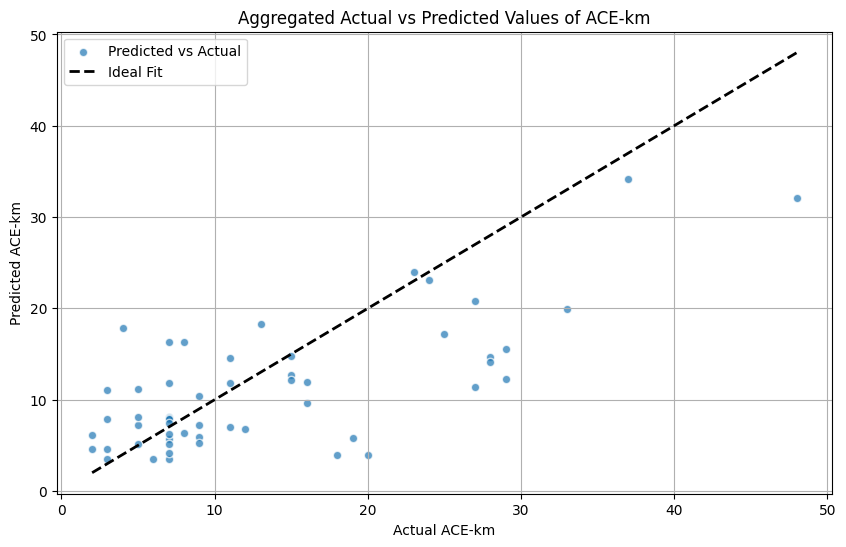


Overall Cross-Validation Metrics for ACE-km:
Mean Squared Error: 55.6104
R-squared: 0.4639


2024-11-18 14:26:52.952256: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-18 14:26:53.260925: W tensorflow/c/c_api.cc:304] Operation '{name:'training_194/Adam/iter/Assign' id:114203 op device:{requested: '', assigned: ''} def:{{{node training_194/Adam/iter/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_INT64, validate_shape=false](training_194/Adam/iter, training_194/Adam/iter/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-18 14:26:55.563834: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-18 14:26:56.288153: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin op


Top 10 features for H2-km based on LRP across folds:
d__Bacteria;p__Desulfobacterota;c__Syntrophia;o__Syntrophales;f__Syntrophaceae;g__Syntrophus: selected in 5 folds
d__Bacteria;p__Chloroflexi;c__Anaerolineae;o__Anaerolineales;f__Anaerolineaceae;g__Leptolinea: selected in 5 folds
Type_CSTR: selected in 5 folds
d__Bacteria;p__Chloroflexi;c__Dehalococcoidia;o__GIF9;f__GIF9;g__GIF9: selected in 5 folds
d__Bacteria;p__Patescibacteria;c__ABY1;o__Candidatus_Magasanikbacteria;f__Candidatus_Magasanikbacteria;g__Candidatus_Magasanikbacteria: selected in 4 folds
d__Bacteria;p__Spirochaetota;c__Leptospirae;o__Leptospirales;f__Leptospiraceae;g__RBG-16-49-21: selected in 4 folds
d__Bacteria;p__Desulfobacterota;c__Syntrophobacteria;o__Syntrophobacterales;f__Syntrophobacteraceae;g__Syntrophobacter: selected in 3 folds
d__Bacteria;p__Synergistota;c__Synergistia;o__Synergistales;f__Synergistaceae;g__Lactivibrio: selected in 3 folds
d__Bacteria;p__Firmicutes;c__Bacilli;o__Acholeplasmatales;f__Acholepl

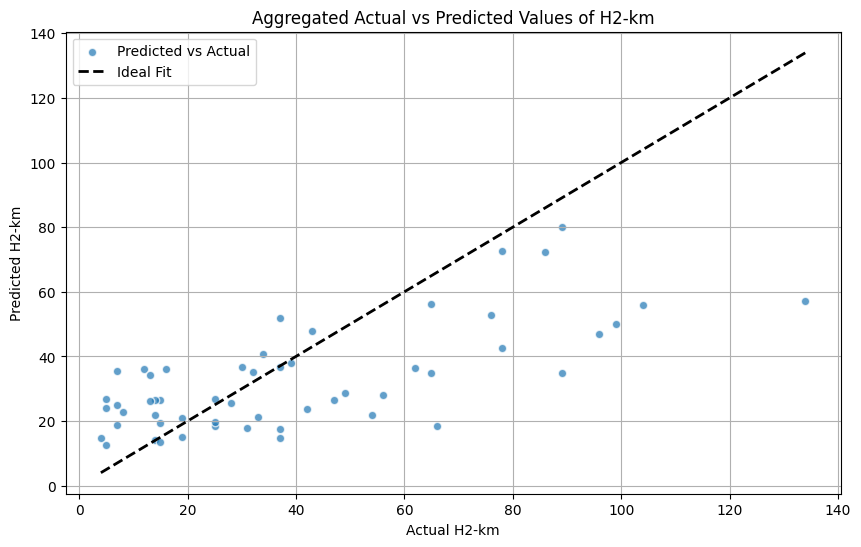


Overall Cross-Validation Metrics for H2-km:
Mean Squared Error: 574.8340
R-squared: 0.3997


In [ ]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from collections import Counter
import innvestigate

# Disable eager execution for compatibility with innvestigate
tf.compat.v1.disable_eager_execution()

# Function to build the neural network model with dynamic kernel size
def build_model(input_shape):
    kernel_size = 3 if input_shape[0] >= 3 else 1  # Dynamically adjust kernel size based on input shape
    model = Sequential([
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding='same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001))
    return model

# Target columns
target_columns = ['ACE-km', 'H2-km']

# Clean the data and remove rows with 'x'
df_cleaned = df_use[~df_use.isin(['x']).any(axis=1)]

# Apply MinMax normalization only to non-target columns
non_target_columns = df_cleaned.select_dtypes(include=[np.number]).columns.difference(target_columns)
scaler = MinMaxScaler()
df_cleaned[non_target_columns] = scaler.fit_transform(df_cleaned[non_target_columns])

df_cleaned = df_cleaned.astype(np.float32)

# Initialize k-fold cross-validator
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# LRP feature relevance storage
lrp_cache = pd.DataFrame()

# Perform k-fold cross-validation for each target
for target_column in target_columns:
    X = df_cleaned.drop(columns=target_columns)
    y = df_cleaned[target_column].values
    X = X.values.reshape(X.shape[0], X.shape[1], 1)  # Reshape for Conv1D

    all_selected_features = []
    y_tests, y_preds = [], []

    # Perform k-fold cross-validation
    for train_index, test_index in kf.split(X, y):
        # Split data into training and validation sets
        X_train, X_val = X[train_index], X[test_index]
        y_train, y_val = y[train_index], y[test_index]

        # Build and train model for LRP
        model = build_model((X_train.shape[1], 1))
        model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, callbacks=[EarlyStopping(monitor='loss', patience=5)])

        # Run LRP analysis to rank features by relevance
        analyzer = innvestigate.create_analyzer("lrp.z", model)  # Using LRP with "z" rule
        relevance_scores = analyzer.analyze(X_train)[:, :, 0]  # Relevance scores for each feature
        relevance_mean = relevance_scores.mean(axis=0)
        
        # Store LRP scores in DataFrame
        lrp = pd.DataFrame(relevance_mean, index=df_cleaned.drop(columns=target_columns).columns, columns=["Score"])
        lrp["Abs Score"] = np.abs(lrp["Score"])
        lrp.sort_values(by="Abs Score", ascending=False, inplace=True)

        # Select top features based on relevance
        num_features = 10
        selected_features = lrp.index[:num_features]
        all_selected_features.extend(selected_features)

        # Get indices of the top features
        selected_indices = [df_cleaned.drop(columns=target_columns).columns.get_loc(col) for col in selected_features]
        
        # Select most relevant features for training
        X_train_rfe = X_train[:, selected_indices]
        X_val_rfe = X_val[:, selected_indices]

        # Retrain model using only the selected features
        model = build_model((X_train_rfe.shape[1], 1))
        model.fit(X_train_rfe, y_train, epochs=100, batch_size=16, verbose=0)

        # Predict on the validation set and collect results
        y_pred = model.predict(X_val_rfe).flatten()
        y_tests.extend(y_val)
        y_preds.extend(y_pred)

    # Print top selected features across folds
    feature_counter = Counter(all_selected_features)
    top_features = feature_counter.most_common(10)
    print(f"\nTop 10 features for {target_column} based on LRP across folds:")
    for feature, count in top_features:
        print(f"{feature}: selected in {count} folds")

    # Calculate and display overall metrics
    mse_overall = mean_squared_error(y_tests, y_preds)
    r2_overall = r2_score(y_tests, y_preds)
    
    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_tests, y_preds, alpha=0.7, edgecolors='w', label='Predicted vs Actual')
    plt.plot([min(y_tests), max(y_tests)], [min(y_tests), max(y_tests)], 'k--', lw=2, label='Ideal Fit')
    plt.xlabel(f'Actual {target_column}')
    plt.ylabel(f'Predicted {target_column}')
    plt.title(f'Aggregated Actual vs Predicted Values of {target_column}')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\nOverall Cross-Validation Metrics for {target_column}:")
    print(f"Mean Squared Error: {mse_overall:.4f}")
    print(f"R-squared: {r2_overall:.4f}")


## Leave One Out CV

In [ ]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from collections import Counter
import innvestigate

# Disable eager execution for compatibility with innvestigate
tf.compat.v1.disable_eager_execution()

# Function to build the neural network model with dynamic kernel size
def build_model(input_shape):
    kernel_size = 3 if input_shape[0] >= 3 else 1  # Dynamically adjust kernel size based on input shape
    model = Sequential([
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding='same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001))
    return model

# Target columns
target_columns = ['ACE-km', 'H2-km']

# Clean the data and remove rows with 'x'
df_cleaned = df_use[~df_use.isin(['x']).any(axis=1)]

# Apply MinMax normalization only to non-target columns
non_target_columns = df_cleaned.select_dtypes(include=[np.number]).columns.difference(target_columns)
scaler = MinMaxScaler()
df_cleaned[non_target_columns] = scaler.fit_transform(df_cleaned[non_target_columns])

df_cleaned = df_cleaned.astype(np.float32)

# Define Leave-One-Out Cross-Validation
num_samples = len(df_cleaned)
num_folds = num_samples  # Leave-One-Out = One fold per sample
chunks = np.arange(num_samples + 1)  # Create indices for LOO splitting

# Perform LOO-CV for each target
for target_column in target_columns:
    X = df_cleaned.drop(columns=target_columns)
    y = df_cleaned[target_column].values
    X = X.values.reshape(X.shape[0], X.shape[1], 1)  # Reshape for Conv1D

    all_selected_features = []
    y_tests, y_preds = [], []

    for fold in range(num_folds):
        # Select validation samples
        val_start, val_end = chunks[fold], chunks[fold + 1]
        X_val = X[val_start:val_end]
        y_val = y[val_start:val_end]

        # Select training samples
        X_train = np.concatenate([X[:val_start], X[val_end:]])
        y_train = np.concatenate([y[:val_start], y[val_end:]])

        # Build and train model for LRP
        model = build_model((X_train.shape[1], 1))
        model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, callbacks=[EarlyStopping(monitor='loss', patience=5)])

        # Run LRP analysis to rank features by relevance
        analyzer = innvestigate.create_analyzer("lrp.z", model)  # Using LRP with "z" rule
        relevance_scores = analyzer.analyze(X_train)[:, :, 0]  # Relevance scores for each feature
        relevance_mean = relevance_scores.mean(axis=0)

        # Store LRP scores in DataFrame
        lrp = pd.DataFrame(relevance_mean, index=df_cleaned.drop(columns=target_columns).columns, columns=["Score"])
        lrp["Abs Score"] = np.abs(lrp["Score"])
        lrp.sort_values(by="Abs Score", ascending=False, inplace=True)

        # Select top features based on relevance
        num_features = 10
        selected_features = lrp.index[:num_features]
        all_selected_features.extend(selected_features)

        # Get indices of the top features
        selected_indices = [df_cleaned.drop(columns=target_columns).columns.get_loc(col) for col in selected_features]

        # Select most relevant features for training
        X_train_rfe = X_train[:, selected_indices]
        X_val_rfe = X_val[:, selected_indices]

        # Retrain model using only the selected features
        model = build_model((X_train_rfe.shape[1], 1))
        model.fit(X_train_rfe, y_train, epochs=100, batch_size=16, verbose=0)

        # Predict on the validation set and collect results
        y_pred = model.predict(X_val_rfe).flatten()
        y_tests.extend(y_val)
        y_preds.extend(y_pred)

    # Print top selected features across folds
    feature_counter = Counter(all_selected_features)
    top_features = feature_counter.most_common(10)
    print(f"\nTop 10 features for {target_column} based on LRP across folds:")
    for feature, count in top_features:
        print(f"{feature}: selected in {count} folds")

    # Calculate and display overall metrics
    mse_overall = mean_squared_error(y_tests, y_preds)
    r2_overall = r2_score(y_tests, y_preds)

    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_tests, y_preds, alpha=0.7, edgecolors='w', label='Predicted vs Actual')
    plt.plot([min(y_tests), max(y_tests)], [min(y_tests), max(y_tests)], 'k--', lw=2, label='Ideal Fit')
    plt.xlabel(f'Actual {target_column}')
    plt.ylabel(f'Predicted {target_column}')
    plt.title(f'Aggregated Actual vs Predicted Values of {target_column}')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\nOverall Cross-Validation Metrics for {target_column}:")
    print(f"Mean Squared Error: {mse_overall:.4f}")
    print(f"R-squared: {r2_overall:.4f}")


2024-11-19 09:29:44.562627: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-19 09:29:45.079894: W tensorflow/c/c_api.cc:304] Operation '{name:'training_244/Adam/dense_316/bias/m/Assign' id:143422 op device:{requested: '', assigned: ''} def:{{{node training_244/Adam/dense_316/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_244/Adam/dense_316/bias/m, training_244/Adam/dense_316/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-19 09:29:49.248263: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-19 09:29:50.281390: I tensorflow/core/grappler/optimizers/c

## Custom CV

In [8]:
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from collections import Counter
import innvestigate

# Disable eager execution for compatibility with innvestigate
tf.compat.v1.disable_eager_execution()

# Function to build the neural network model with dynamic kernel size
def build_model(input_shape):
    kernel_size = 3 if input_shape[0] >= 3 else 1  # Dynamically adjust kernel size based on input shape
    model = Sequential([
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', input_shape=input_shape, padding='same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=128, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=64, kernel_size=kernel_size, activation='relu', padding='same'),
        Dropout(0.3),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Conv1D(filters=32, kernel_size=kernel_size, activation='relu', padding='same'),
        Flatten(),
        Dense(64, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=0.0001))
    return model

# Target columns
target_columns = ['ACE-km', 'H2-km']

# Clean the data and remove rows with 'x'
df_cleaned = df_use[~df_use.isin(['x']).any(axis=1)]

# Apply MinMax normalization only to non-target columns
non_target_columns = df_cleaned.select_dtypes(include=[np.number]).columns.difference(target_columns)
scaler = MinMaxScaler()
df_cleaned[non_target_columns] = scaler.fit_transform(df_cleaned[non_target_columns])

df_cleaned = df_cleaned.astype(np.float32)

# Define the number of folds
num_folds = 18

# Split data into custom k-folds
num_samples = len(df_cleaned)
fold_size = num_samples // num_folds
chunks = [i * fold_size for i in range(num_folds)] + [num_samples]  # Last fold includes the remaining samples

# Perform k-fold cross-validation for each target
for target_column in target_columns:
    X = df_cleaned.drop(columns=target_columns)
    y = df_cleaned[target_column].values
    X = X.values.reshape(X.shape[0], X.shape[1], 1)  # Reshape for Conv1D

    all_selected_features = []
    y_tests, y_preds = [], []

    for fold in range(num_folds):
        # Select validation samples
        val_start, val_end = chunks[fold], chunks[fold + 1]
        X_val = X[val_start:val_end]
        y_val = y[val_start:val_end]

        # Select training samples
        X_train = np.concatenate([X[:val_start], X[val_end:]])
        y_train = np.concatenate([y[:val_start], y[val_end:]])

        # Build and train model for LRP
        model = build_model((X_train.shape[1], 1))
        model.fit(X_train, y_train, epochs=100, batch_size=16, verbose=0, callbacks=[EarlyStopping(monitor='loss', patience=5)])

        # Run LRP analysis to rank features by relevance
        analyzer = innvestigate.create_analyzer("lrp.z", model)  # Using LRP with "z" rule
        relevance_scores = analyzer.analyze(X_train)[:, :, 0]  # Relevance scores for each feature
        relevance_mean = relevance_scores.mean(axis=0)

        # Store LRP scores in DataFrame
        lrp = pd.DataFrame(relevance_mean, index=df_cleaned.drop(columns=target_columns).columns, columns=["Score"])
        lrp["Abs Score"] = np.abs(lrp["Score"])
        lrp.sort_values(by="Abs Score", ascending=False, inplace=True)

        # Select top features based on relevance
        num_features = 10
        selected_features = lrp.index[:num_features]
        all_selected_features.extend(selected_features)

        # Get indices of the top features
        selected_indices = [df_cleaned.drop(columns=target_columns).columns.get_loc(col) for col in selected_features]

        # Select most relevant features for training
        X_train_rfe = X_train[:, selected_indices]
        X_val_rfe = X_val[:, selected_indices]

        # Retrain model using only the selected features
        model = build_model((X_train_rfe.shape[1], 1))
        model.fit(X_train_rfe, y_train, epochs=100, batch_size=16, verbose=0)

        # Predict on the validation set and collect results
        y_pred = model.predict(X_val_rfe).flatten()
        y_tests.extend(y_val)
        y_preds.extend(y_pred)

    # Print top selected features across folds
    feature_counter = Counter(all_selected_features)
    top_features = feature_counter.most_common(10)
    print(f"\nTop 10 features for {target_column} based on LRP across folds:")
    for feature, count in top_features:
        print(f"{feature}: selected in {count} folds")

    # Calculate and display overall metrics
    mse_overall = mean_squared_error(y_tests, y_preds)
    r2_overall = r2_score(y_tests, y_preds)

    # Plot actual vs predicted values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_tests, y_preds, alpha=0.7, edgecolors='w', label='Predicted vs Actual')
    plt.plot([min(y_tests), max(y_tests)], [min(y_tests), max(y_tests)], 'k--', lw=2, label='Ideal Fit')
    plt.xlabel(f'Actual {target_column}')
    plt.ylabel(f'Predicted {target_column}')
    plt.title(f'Aggregated Actual vs Predicted Values of {target_column}')
    plt.legend()
    plt.grid(True)
    plt.show()

    print(f"\nOverall Cross-Validation Metrics for {target_column}:")
    print(f"Mean Squared Error: {mse_overall:.4f}")
    print(f"R-squared: {r2_overall:.4f}")


2024-11-19 08:55:37.936397: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-19 08:55:38.457265: W tensorflow/c/c_api.cc:304] Operation '{name:'training_214/Adam/conv1d_1403/kernel/m/Assign' id:126062 op device:{requested: '', assigned: ''} def:{{{node training_214/Adam/conv1d_1403/kernel/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_214/Adam/conv1d_1403/kernel/m, training_214/Adam/conv1d_1403/kernel/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-11-19 08:55:41.832743: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2024-11-19 08:55:42.641178: I tensorflow/core/grapp

KeyboardInterrupt: 